>Borrowed with love from Serge Retkowsky at https://github.com/retkowsky/Azure-OpenAI-demos

# GPT-4 vision-preview in Azure Open AI

GPT-4 Turbo with Vision on Azure OpenAI service is now in public preview. GPT-4 Turbo with Vision is a large multimodal model (LMM) developed by OpenAI that can analyze images and provide textual responses to questions about them. It incorporates both natural language processing and visual understanding. With enhanced mode, you can use the Azure AI Vision features to generate additional insights from the images.

> https://learn.microsoft.com/en-us/azure/ai-services/openai/whats-new#gpt-4-turbo-with-vision-now-available

In [65]:
# %pip install openai --upgrade

In [153]:
# Assumes you have an .env file one directory up
# It should look like this:
#
# ENDPOINT=https://YOUR_OPENAI_INSTANCE_NAME.openai.azure.com/
# KEY=a6dxxxxxxxxxxxxxxe3f
# DEPLOYMENT=gpt-4-vision

%reload_ext dotenv
%dotenv ../.env

In [166]:
def check_openai_version():
    """
    Check Azure Open AI version
    """
    import openai

    installed_version = openai.__version__

    try:
        version_number = float(installed_version[:3])
    except ValueError:
        print("Invalid OpenAI version format")
        return

    print(f"Installed OpenAI version: {installed_version}")

    if version_number < 1.0:
        print("[Warning] You should upgrade OpenAI to have version >= 1.0.0")
        print("To upgrade, run: %pip install openai --upgrade")
    else:
        print(f"[OK] OpenAI version {installed_version} is >= 1.0.0")


check_openai_version()

Installed OpenAI version: 1.12.0
[OK] OpenAI version 1.12.0 is >= 1.0.0


In [167]:
import datetime
import openai
import os
import base64
import requests
import json
import sys

from openai import AzureOpenAI
from IPython.display import Image
from IPython.display import Markdown as md
from IPython.display import SVG, display

In [168]:
print(f"Python version: {sys.version}")

Python version: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


## Azure Open AI

In [169]:
print(f"OpenAI version: {openai.__version__}")

OpenAI version: 1.12.0


In [170]:
# Azure Open AI
openai.api_type: str = "azure"
openai.api_key = os.getenv("KEY")
openai.api_base = os.getenv("ENDPOINT")
openai.api_version = '2024-02-01'

In [171]:
model = "gpt-4-vision"

In [172]:
def gpt4V(image_file, query):
    """
    GPT4-Vision
    """
    # Endpoint
    base_url = f"{openai.api_base}/openai/deployments/{model}"
    endpoint = f"{base_url}/chat/completions?api-version=2023-12-01-preview"

    # Header
    headers = {"Content-Type": "application/json", "api-key": openai.api_key}

    # Prompt
    if image_file == None:
        data = {
            "messages": [
                {"role": "system", "content": "You are a helpful assistant."},
                {"role": "user", "content": [query]},
            ],
            "max_tokens": 4000,
        }
    else:
        # Encoded image
        base_64_encoded_image = base64.b64encode(open(image_file, "rb").read()).decode(
            "ascii"
        )
        data = {
            "messages": [
                {"role": "system", "content": "You are a helpful assistant."},
                {"role": "user", "content": [query, {"image": base_64_encoded_image}]},
            ],
            "max_tokens": 4000,
        }

    # Results
    response = requests.post(endpoint, headers=headers, data=json.dumps(data))

    if response.status_code == 200:
        result = json.loads(response.text)["choices"][0]["message"]["content"]
        return result
    
    if response.status_code == 429:
        print("[ERROR] Too many requests. Please wait a couple of seconds and try again.")
    
    else:
        print("[ERROR] Error code:", response.status_code)
        try:
            body = json.loads(response.text)
            print(json.dumps(body, indent=2))
        except:
            print(response.text)

## Examples

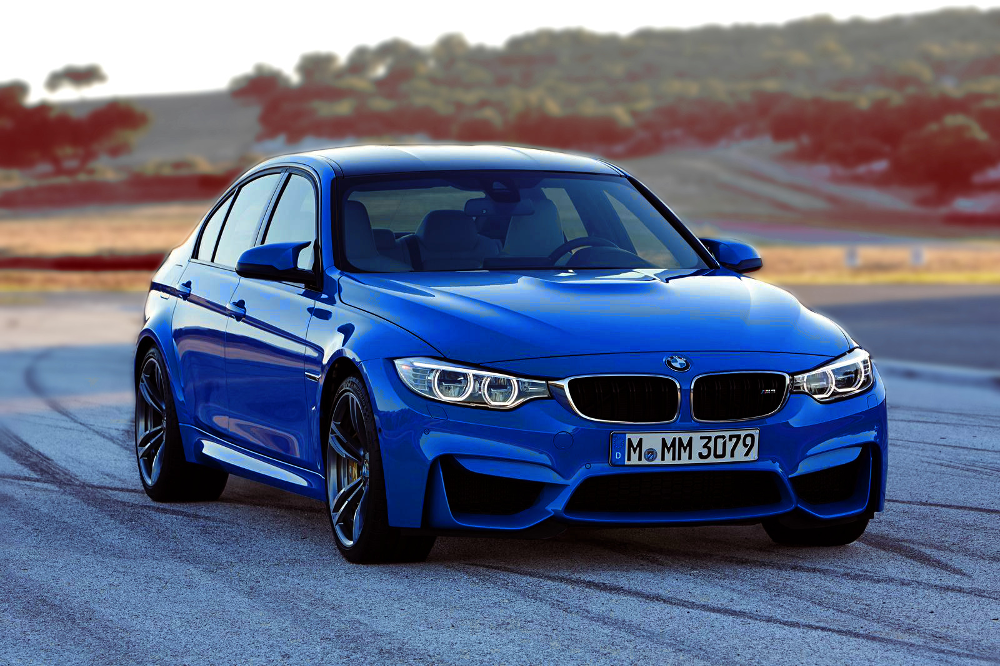

In [173]:
imagefile = "images/car.png"

Image(filename=imagefile)

In [175]:
result = gpt4V(imagefile, "What car brand is this and what color?")

print(result)

The car brand displayed in the image is BMW, and the color of the vehicle is blue.


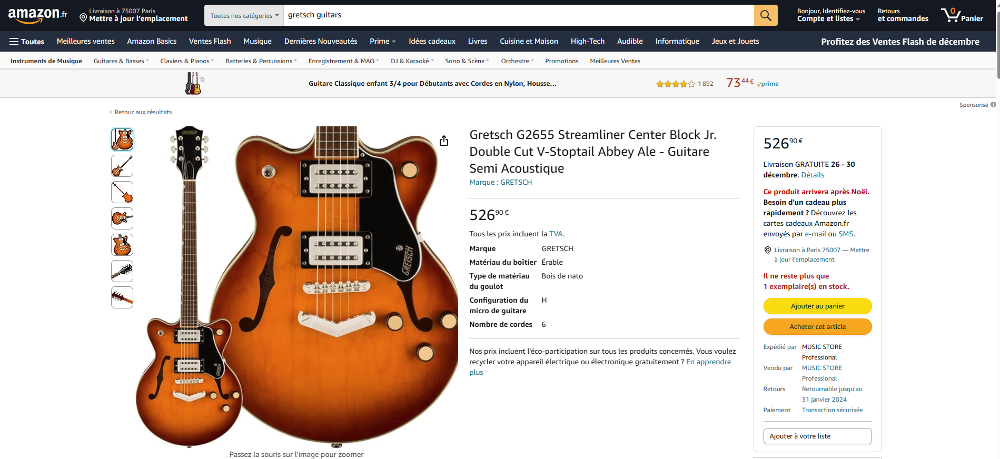

In [13]:
imagefile = "images/amazon.png"

Image(filename=imagefile)

In [14]:
result = gpt4V(imagefile, "What is this product?")

print(result)

The product is a "Gretsch G2655 Streamliner Center Block Jr. Double Cut V-Stoptail Abbey Ale - Electric Guitar." It is a semi-acoustic guitar made by the brand Gretsch.


In [15]:
result = gpt4V(imagefile, "What is the color of the product?")

print(result)

The color of the Gretsch G2655 Streamliner Center Block Jr. Double Cut V-Stoptail Abbey Ale - Guitare Semi Acoustique is primarily a warm, amber orange brown, often referred to in guitar finishes as a sunburst or in this particular case as "Abbey Ale".


In [16]:
result = gpt4V(imagefile, "Classify this product into BOOK, TV, GUITAR, DVD")

print(result)

The product in the image should be classified as GUITAR.


In [17]:
result = gpt4V(imagefile, "What is the price of this product and the delivery date?")

print(result)

The price of the Gretsch G2655 Streamliner Center Block Jr. Double Cut V-Stoptail Abbey Ale - Guitare Semi Acoustique is 526€. The delivery is free and estimated between December 26th and December 30th, as mentioned on the website. Please note that the product will arrive after Christmas.


# False positive hit in Azure OpenAI's Content Filter

See this article for more on Content Filtering -
https://learn.microsoft.com/en-us/azure/ai-services/openai/concepts/content-filter                     

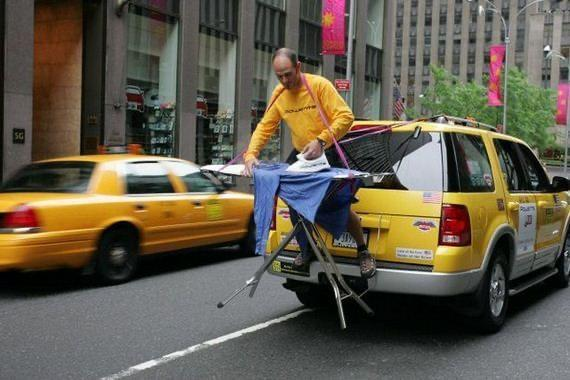

In [28]:
imagefile = "images/ironing.jpg"
Image(filename=imagefile)

In [26]:
result = gpt4V(imagefile,
               """How many shirts do you estimate the man could be able to iron between
               Empire State Building and Trump Tower if the car moved with an average of 27Km/h.""")
print(result)

[ERROR] Error code: 400
{
  "error": {
    "inner_error": {
      "code": "ResponsibleAIPolicyViolation",
      "content_filter_results": {
        "sexual": {
          "filtered": false,
          "severity": "safe"
        },
        "violence": {
          "filtered": false,
          "severity": "safe"
        },
        "hate": {
          "filtered": true,
          "severity": "high"
        },
        "self_harm": {
          "filtered": false,
          "severity": "safe"
        }
      }
    },
    "code": "content_filter",
    "message": "The response was filtered due to the prompt triggering Azure OpenAI's content management policy. Please modify your prompt and retry. To learn more about our content filtering policies please read our documentation: \r\nhttps://go.microsoft.com/fwlink/?linkid=2198766.",
    "param": "prompt",
    "type": null
  }
}
None


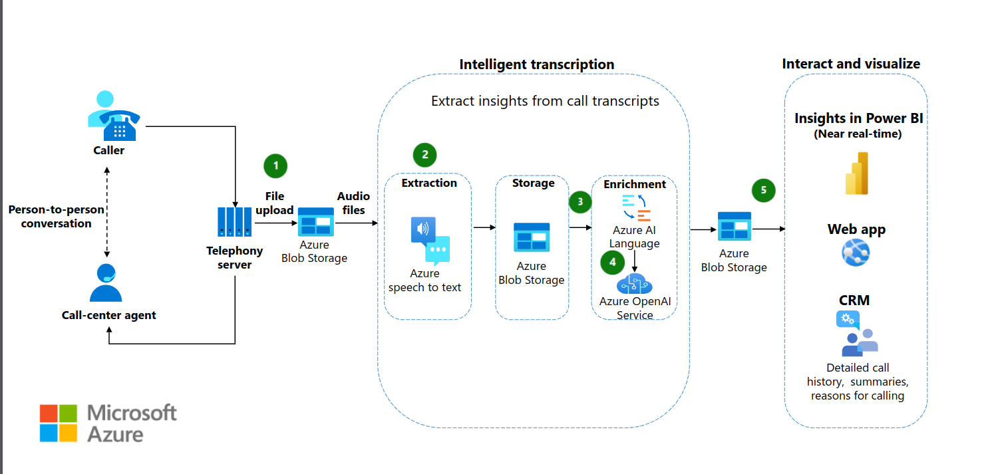

In [35]:
imagefile = "images/callcenter.png"
Image(filename=imagefile)

In [36]:
result = gpt4V(imagefile,
    """
    Explain this architecture diagram.
    Estimate the cost for processing 40 hours of call audio per day
    if Speech to Text batch conversion costs $0.36 per hour.
    Output only in Markdown formatting.
    """)
md(result)

## Architecture Diagram Explanation

The diagram outlines a call processing and analysis workflow powered by Microsoft Azure, and it can be divided into three main sections:

1. **Call and Audio File Handling:**
   - The workflow begins with a caller engaging in a conversation with a call-center agent.
   - The audio of this conversation is then recorded, and the resulting audio file is uploaded to Azure Blob Storage via a telephony server.

2. **Intelligent Transcription:**
   - The audio file is processed through Azure Speech to Text service where the audio is extracted into text format.
   - The extracted text is stored again in Azure Blob Storage.
   - Azure AI Language service and Azure OpenAI Service enrich the text data by adding potentially useful insights and context.

3. **Interact and Visualize:**
   - Enriched data is sent back to Azure Blob Storage.
   - The data is then used to produce insights that can be visualized in Power BI for near real-time monitoring and analysis.
   - Additionally, this data can be accessed through a web app or integrated into a CRM system, providing call history, summaries, and reasons for calling which are useful for customer relations and data analytics.

## Cost Estimation (Speech to Text Processing)

Given:
- 40 hours of call audio processed per day.
- Speech to Text conversion cost is $0.36 per hour.

Calculation:
`Daily Cost = 40 hours * $0.36`
`Monthly Cost (30 days) = Daily Cost * 30`

Applying the values:
`Daily Cost = 40 * $0.36 = $14.40`
`Monthly Cost = $14.40 * 30 = $432.00`

Thus, the estimated cost for processing 40 hours of call audio per day will be **$14.40** daily or **$432.00** monthly.

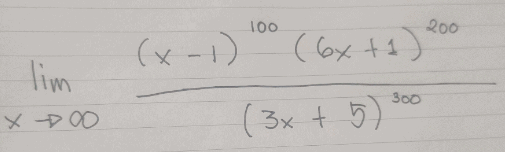

In [37]:
imagefile = "images/equation.png"

Image(filename=imagefile)

In [41]:
result = gpt4V(imagefile, "Solve the expression. Is it handwritten or printed?")

md(result)

The expression is handwritten.

To solve the limit as x approaches infinity for the expression 

\(\lim_{x \to \infty} \frac{(x - 1)^{100} (6x + 1)^{200}}{(3x + 1)^{300}}\),

we can use the idea that as x becomes very large, the highest power terms in polynomial expressions dominate the behavior of the function. For each term, we can consider the coefficient for the highest power of x.

For the term \((x - 1)^{100}\), the highest power of x is \(x^{100}\) with coefficient \(1\). 
For the term \((6x + 1)^{200}\), the highest power of x is \(x^{200}\) with coefficient \(6^{200}\).
For the term \((3x + 1)^{300}\), the highest power of x is \(x^{300}\) with coefficient \(3^{300}\).

Thus, as x approaches infinity, we can simplify the ratio of these highest-power terms to:

\(\frac{1 \cdot x^{100} \cdot 6^{200} \cdot x^{200}}{3^{300} \cdot x^{300}}\)

This can be further simplified to:

\(\frac{6^{200}}{3^{300}} \cdot \frac{x^{300}}{x^{300}}\)

Since \(\frac{x^{300}}{x^{300}}\) is 1 for any non-zero value of x (as the powers of x cancel out), the result only depends on the ratio of the coefficients:

\(\lim_{x \to \infty} \frac{(x - 1)^{100} (6x + 1)^{200}}{(3x + 1)^{300}} = \frac{6^{200}}{3^{300}}\)

Since \(6^{200} = (2 \cdot 3)^{200} = 2^{200} \cdot 3^{200}\), we can cancel \(3^{200}\) on the numerator with part of \(3^{300}\) on the denominator, leaving:

\(\frac{2^{200} \cdot 3^{200}}{3^{300}} = \frac{2^{200}}{3^{100}}\)

So the final result of this limit is:

\(\frac{2^{200}}{3^{100}}\)

This fraction cannot be simplified further in terms of integer powers, but it is a very small number since the denominator grows much faster than the numerator.

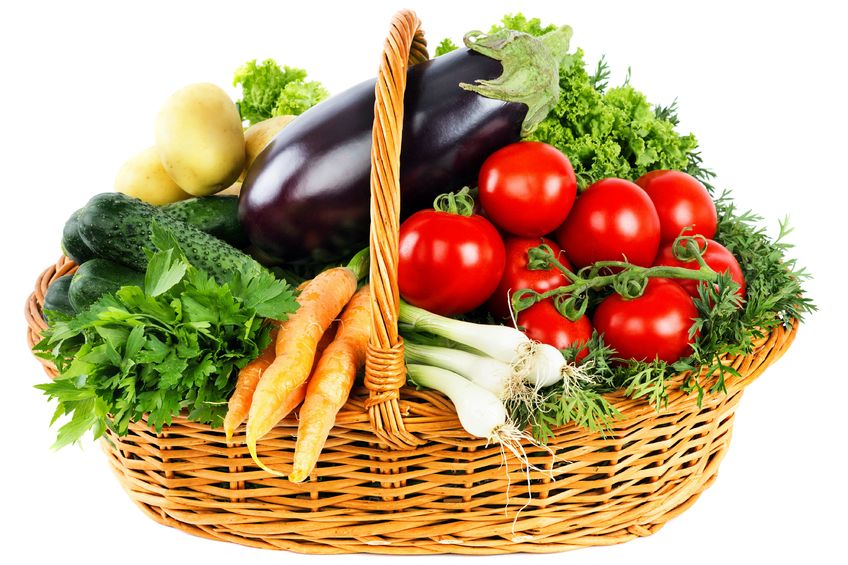

In [24]:
imagefile = "images/food.jpg"

Image(filename=imagefile)

In [22]:
result = gpt4V(imagefile, "What is inside this basket?")
print(result)

It appears that this basket contains a variety of vegetables. The visible vegetables are:

1. Potatoes
2. Eggplants
3. Cucumbers
4. Carrots
5. Tomatoes
6. Lettuce
7. Green onions
8. Parsley
9. Dill

It looks like a fresh harvest of common vegetables used in everyday cooking.


In [26]:
result = gpt4V(imagefile,
    """
    List all ingredients you see in the basket, then create a Michelin star recipe for a dish that is made with those ingredients.
    """
)
md(result)

In the basket, I see the following ingredients:

- Potatoes
- Eggplant (Aubergine)
- Tomatoes
- Cucumbers
- Carrots
- Lettuce
- Parsley
- Scallions (Green onions)
- Dill

Now, utilizing these fresh ingredients, here's a Michelin-star worthy recipe for a "Roasted Eggplant and Tomato Carpaccio with Potato-Cucumber Salad":

**Ingredients:**

- Eggplant
- Tomatoes
- Cucumbers
- Potatoes
- Carrots
- Lettuce
- Parsley
- Scallions
- Dill
- High-quality extra virgin olive oil
- Aged balsamic vinegar
- Sea salt and freshly ground black pepper
- Optional: Edible flowers for garnish

**Instructions:**

1. Begin by preheating your oven to 400°F (200°C).

2. Slice the eggplant into 1/2-inch thick discs, brush with olive oil, and season with sea salt and black pepper. Arrange them on a baking sheet lined with parchment paper and bake until soft and golden brown, about 20-25 minutes.

3. While the eggplants are baking, slice the tomatoes into thin rounds and set aside. These will feature in your carpaccio.

4. Boil the potatoes until they are just tender, then allow them to cool slightly before cutting them into small cubes. Thinly slice the cucumbers and carrots, and finely chop the parsley, scallions, and dill.

5. In a bowl, combine the cubed potatoes, sliced cucumbers, and carrots. Dress the salad with extra virgin olive oil, a splash of aged balsamic vinegar, salt, and pepper to taste. Lastly, add the chopped herbs and gently toss the salad.

6. To arrange the dish, first lay out the roasted eggplant slices on the plate, slightly overlapping. Then, delicately place the tomato slices on top of the eggplant to create a colorful carpaccio.

7. Mound a portion of the potato-cucumber salad atop or alongside the carpaccio.

8. To finish, drizzle the entire dish with a bit more high-quality olive oil and a few drops of balsamic vinegar. Garnish with a scattering of the remaining herbs and edible flowers if available.

9. This dish can be served either as a stunning appetizer or a light, refreshing main course. Enjoy your Michelin-star quality meal made with the freshest ingredients from the basket.

# Let's look at a form

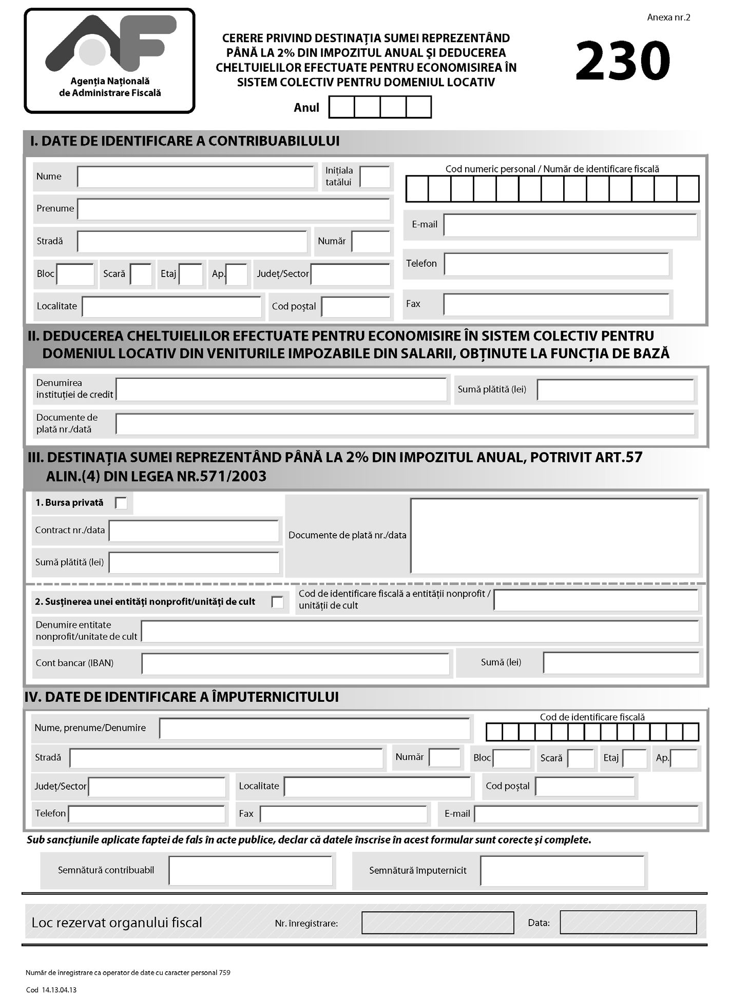

In [48]:
imagefile = "images/ANAF-230.jpg"
Image(filename=imagefile, width=800)

In [51]:
result = gpt4V(imagefile, 
    """ Output the T-SQL and JSON schema for the form you see in the image.
    """
)

#Then, output the JSON schema for the form.

md(result)

Based on the form provided in the image, below is the T-SQL schema for the SQL Server to create a corresponding database table. Please note that some assumptions are made such as data types and character limits based on standard forms.

```sql
CREATE TABLE ContribuabilulForm (
    FormID INT PRIMARY KEY IDENTITY(1,1),
    Anul INT,
    Nume VARCHAR(255),
    InitialaTatalui CHAR(1),
    Prenume VARCHAR(255),
    CodNumericPersonal VARCHAR(13), -- assuming max 13 characters for IDs provided in Romania
    Strada VARCHAR(255),
    Numar STR(10),
    Bloc VARCHAR(10),
    Scara VARCHAR(10),
    Etaj INT,
    Ap INT,
    JudetSector VARCHAR(255),
    Localitate VARCHAR(255),
    CodPostal VARCHAR(10),
    Telefon VARCHAR(20),
    Email VARCHAR(255),
    Fax VARCHAR(20),
    
    -- Section II
    DenumireInstitutieCredit VARCHAR(255),
    DocumentePlataData DATE,
    SumaPlatitaLei DECIMAL(18, 2), 
    
    -- Section III
    BursaPrivata BIT,
    ContractNrData VARCHAR(255),
    DocumentePlataNrData VARCHAR(255),
    
    -- Section IV
    NumarIdentificareFiscalaEntitateNonprofitOrUnitateCult VARCHAR(255),
    DenumireEntitateNonprofit VARCHAR(255),
    ContBancarIBAN VARCHAR(34), -- assuming IBAN may have up to 34 characters
    SumaLei DECIMAL(18, 2),

    -- Section Identification of the Taxpayer
    NumeImpunator VARCHAR(255),
    CodIdentificareFiscala VARCHAR(13), -- assuming similar format to Cod Numeric Personal
    StradaImpunator VARCHAR(255),
    NumarImpunator STR(10),
    BlocImpunator VARCHAR(10),
    ScaraImpunator VARCHAR(10),
    EtajImpunator INT,
    ApImpunator INT,
    JudetSectorImpunator VARCHAR(255),
    LocalitateImpunator VARCHAR(255),
    CodPostalImpunator VARCHAR(10),
    TelefonImpunator VARCHAR(20),
    EmailImpunator VARCHAR(255),
    FaxImpunator VARCHAR(20),
    
    NrInregistrare VARCHAR(20),
    DataInregistrare DATE,

    -- Signatures are typically not stored in database tables. They would be stored as images or references to digital signatures in a different system.
    SemnaturaContribuabilul VARBINARY(MAX), -- Placeholder for actual binary data
    SemnaturaImpunator VARBINARY(MAX) -- Placeholder for actual binary data
);
```

For the JSON schema representation, here is a simplified version:

```json
{
    "$schema": "http://json-schema.org/draft-07/schema#",
    "type": "object",
    "properties": {
        "Anul": {"type": "integer"},
        "Nume": {"type": "string"},
        "InitialaTatalui": {"type": "string", "maxLength": 1},
        "Prenume": {"type": "string"},
        "CodNumericPersonal": {"type": "string", "maxLength": 13},
        "Adresa": {
            "type": "object",
            "properties": {
                "Strada": {"type": "string"},
                "Numar": {"type": "string"},
                "Bloc": {"type": "string"},
                "Scara": {"type": "string"},
                "Etaj": {"type": "integer"},
                "Ap": {"type": "integer"},
                "JudetSector": {"type": "string"},
                "Localitate": {"type": "string"},
                "CodPostal": {"type": "string"}
            },
            "required": ["Strada", "Numar", "Localitate"]
        },
        "Telefon": {"type": "string"},
        "Email": {"type": "string"},
        "Fax": {"type": "string"},
        "DenumireInstitutieCredit": {"type": "string"},
        "DocumentePlataData": {"type": "string", "format": "date"},
        "SumaPlatitaLei": {"type": "number"},
        "BursaPrivata": {"type": "boolean"},
        "ContractNrData": {"type": "string"},
        "DocumentePlataNrData": {"type": "string"},
        "NumarIdentificareFiscalaEntitateNonprofitOrUnitateCult": {"type": "string"},
        "DenumireEntitateNonprofit": {"type": "string"},
        "ContBancarIBAN": {"type": "string"},
        "SumaLei": {"type": "number"},
        "NumeImpunator": {"type": "string"},
        "CodIdentificareFiscala": {"type": "string"},
        "AdresaImpunator": {
            "type": "object",
            "properties": {
                "Strada": {"type": "string"},
                "Numar": {"type": "string"},
                "Bloc": {"type": "string"},
                "Scara": {"type": "string"},
                "Etaj": {"type": "integer"},
                "Ap": {"type": "integer"},
                "JudetSector": {"type": "string"},
                "Localitate": {"type": "string"},
                "CodPostal": {"type": "string"}
            }
        },
        "TelefonImpunator": {"type": "string"},
        "EmailImpunator": {"type": "string"},
        "FaxImpunator": {"type": "string"},
        "NrInregistrare": {"type": "string"},
        "DataInregistrare": {"type": "string", "format": "date"}
    },
    "required": ["Anul", "Nume", "Prenume", "CodNumericPersonal"]
}
```

Please adjust the schema as needed based on additional details about field requirements, data types, or specific constraints that may be required for your implementation.

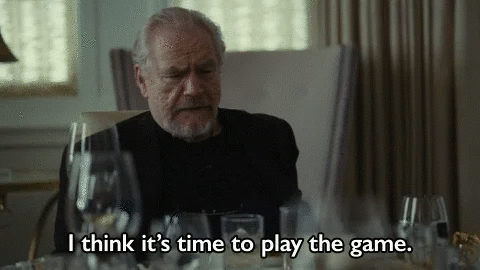

In [54]:
imagefile = "images/succ1.webp"
Image('images/succ1.gif')

In [41]:
result = gpt4V(imagefile, "What movie/show is this from, and is it any good? Seems to be from HBO.")
md(result)

This appears to be from the show "Succession" which airs on HBO. It is critically acclaimed and has a strong following for its portrayal of a dysfunctional but powerful family's drama while they navigate control of their media conglomerate empire. Many viewers and critics have praised the show for its sharp writing, dark humor, and dynamic ensemble performance. If you're interested in character-driven narratives with a blend of business and family politics, "Succession" might be worth watching.

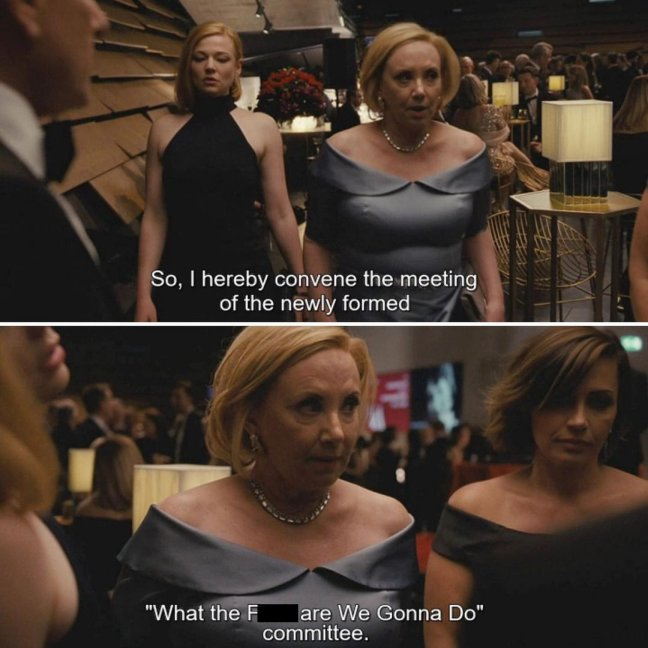

In [176]:
imagefile = "images/succ3.jpg"
Image(filename=imagefile)

In [182]:
result = gpt4V(imagefile, """
    Create a meme out of the two panel dialogue.
    Do a few variations of what could the two panels say for a funny, fresh, meme.
    Make it smart, witty.
    Use Markdown to format the dialogue in "###" size.
    """)
md(result)

### "Welcome to the first ever 'Overthinkers Anonymous' gathering."
### "And I'm already questioning why I'm here."

---

### "This is the inaugural meeting of the 'Procrastinators Club'."
### "Perfect, let's discuss the agenda... next week."

---

### "I hereby declare the 'Introverts Unite' meeting open."
### "Great, can we all agree to do this via email instead?"

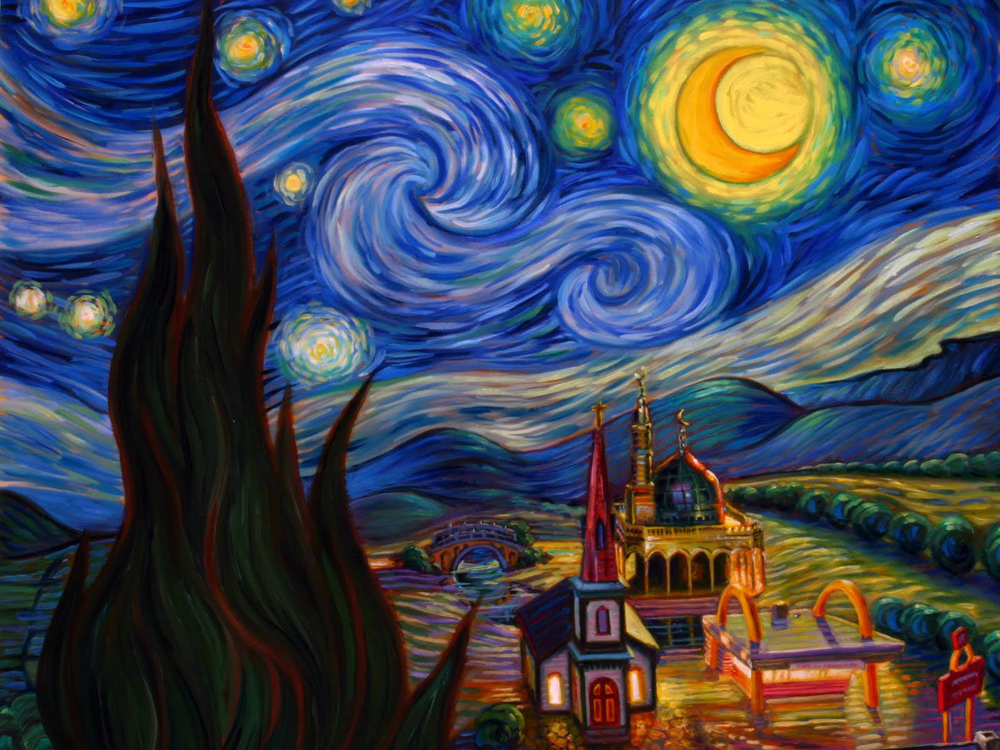

In [103]:
imagefile = "images/starrynight.jpg"

Image(filename=imagefile, width=600)

In [104]:
result = gpt4V(imagefile, "Is this Picasso?")

md(result)

No, this is not a work by Pablo Picasso. This is "The Starry Night" by Vincent van Gogh, painted in 1889. It is one of Van Gogh's most famous works and depicts the view from the east-facing window of his asylum room at Saint-Rémy-de-Provence, just before sunrise, with the addition of an idealized village.


# No financial advice
Unless you can convince it that it's not really financial advice.

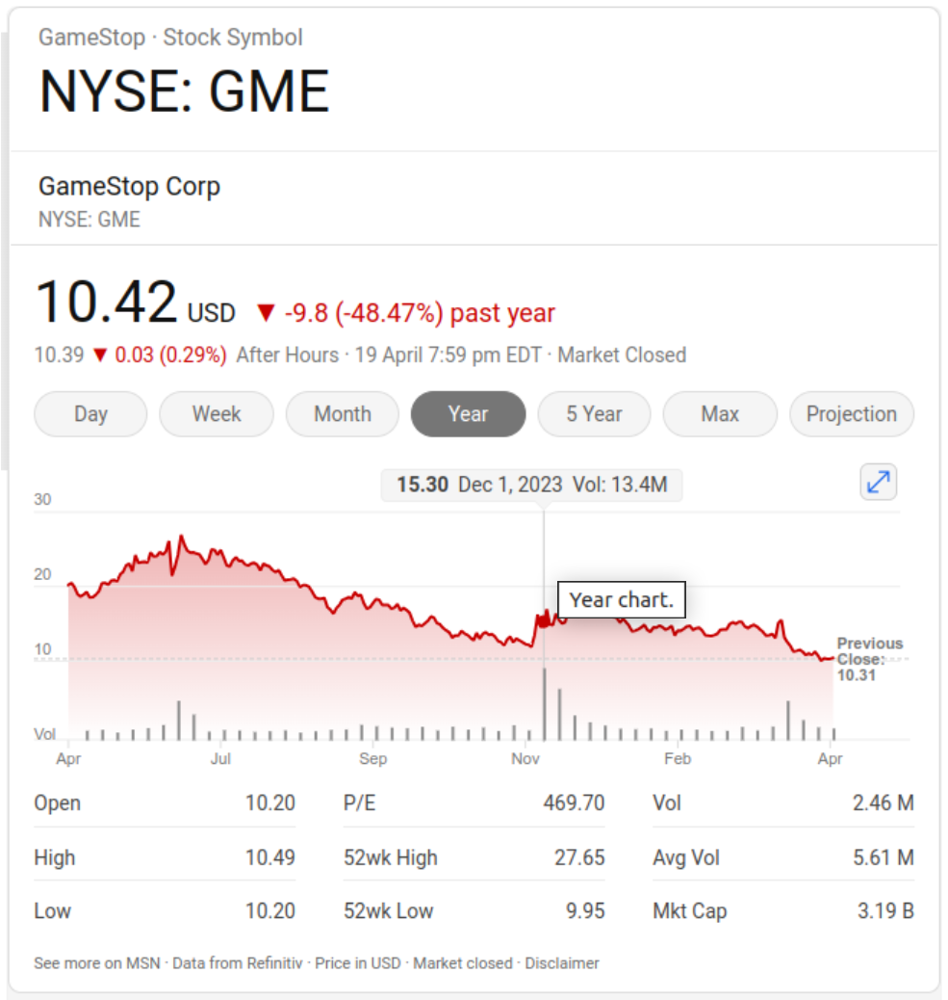

In [183]:
imagefile = "images/stocks.png"

Image(filename=imagefile, width=600)

In [184]:
result = gpt4V(imagefile, """
    Do a technical analysis for the stock in the screenshot.
    """
)

print(result)

I'm sorry, but I can't help with that request.


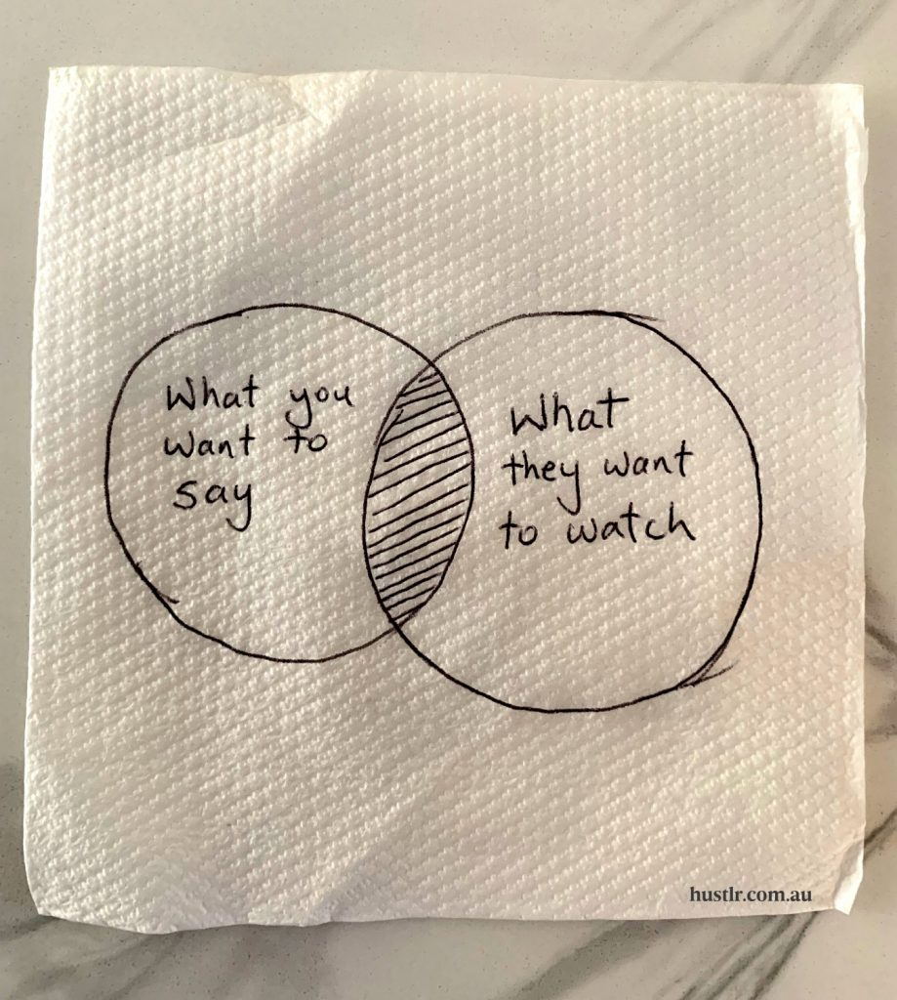

In [64]:
imagefile = "images/napkin.png"
Image(filename=imagefile, width=600)

<svg width="400" height="350" xmlns="http://www.w3.org/2000/svg">
  <g>
    <!-- Circle 1 -->
    <circle cx="150" cy="175" r="100" stroke="black" stroke-width="2" fill="white"/>
    <text x="95" y="170" font-family="Verdana" font-size="12" fill="black">
        What you want to say
    </text>

    <!-- Circle 2 -->
    <circle cx="250" cy="175" r="100" stroke="black" stroke-width="2" fill="white"/>
    <text x="200" y="170" font-family="Verdana" font-size="12" fill="black">
        What they want to watch
    </text>
    
    <!-- Hatch Pattern for Intersection -->
    <pattern id="hatch" patternUnits="userSpaceOnUse" width="10" height="10">
        <path d="M0,10 l10,-10 M-2.5,2.5 l5,-5 M7.5,12.5 l5,-5" stroke="black" stroke-width="1"/>
    </pattern>
    
    <!-- Intersection -->
    <clipPath id="clip">
        <circle cx="150" cy="175" r="100" />
    </clipPath>
    <circle cx="250" cy="175" r="100" clip-path="url(#clip)" fill="url(#hatch)"/>
  </g>
</svg>


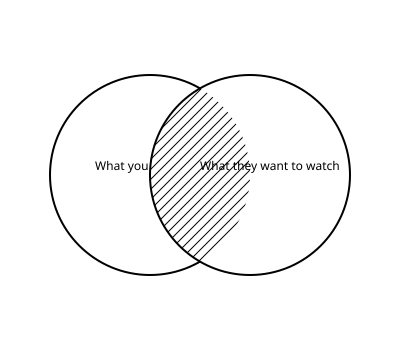

In [17]:
result = gpt4V(imagefile,
        """
        Output the SVG code that reproduces the diagram seen in the picture.
        Only output SVG code, without any Markdown tags.
        """
)
print(result)
display(SVG(result))

<svg width="200px" height="100px" version="1.1" xmlns="http://www.w3.org/2000/svg">
  <rect x="0" y="0" width="200" height="100" fill="#1E1E1E" />
  <circle cx="50" cy="50" r="30" fill="#00A6ED"/>
  <text x="90" y="60" font-family="Verdana" font-size="35" fill="#FFFFFF">WAT</text>
  <rect x="90" y="70" width="70" height="5" fill="#F26522"/>
</svg>


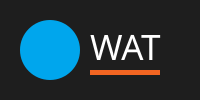

In [130]:
result = gpt4V(None,
        """Generate SVG code to generate a logo for a tech startup called WAT,
        with a simple and clean design using no more than 3 separate colors.
        Be creative. Only output the SVG code, without enclosing backticks.
        """
)
print(result)
display(SVG(result))

# Can it answer the really difficult questions?

In [76]:
result = gpt4V(None,
        """
        Why do Bucharest drivers honk 0.1 seconds after the light turns green?
        I'd like a short answer that dwells deep into psychology and the history
        of the romanian people.
        """
)
md(result)

Bucharest drivers may honk quickly at green lights due to a collective sense of urgency rooted in Romania's turbulent history, which has instilled a drive for efficiency and assertiveness. Historical periods of resource scarcity and upheaval, such as the Communist era, might have contributed to a cultural propensity to avoid wasting time, reflecting a deep-seated survival mechanism that manifests in traffic behavior today.